In [1]:
""" In this notebook - make 4 graphs x 11 years: size~MW, color~region"""



""" Load some libs """
""" python 2 lib using networkx """
import matplotlib.pyplot as plt
import networkx as nx
import random
import math
import pandas as pd
import statsmodels.api as sm
import glob
import os
import numpy as np
from PIL import Image
from helpers import *
import pickle
import time
#random.seed(100)
#tic = time.time()

/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [2]:
""" get all files """
files = glob.glob('./matrix_csvs/*')

g_MW_files = sorted([f for f in files if ((f.split('/')[-1].split('_')[1]=='green')and (f.split('/')[-1].split('_')[2]=='projection.csv') ) ])
b_MW_files =sorted([f for f in files if ((f.split('/')[-1].split('_')[1]=='blue') and (f.split('/')[-1].split('_')[2]=='projection.csv') )])
all_MW_files = sorted([f for f in files if ((f.split('/')[-1].split('_')[1]=='all') and (f.split('/')[-1].split('_')[2]=='projection.csv'))])

print all_MW_files

['./matrix_csvs/2004.75_all_projection.csv', './matrix_csvs/2007.75_all_projection.csv', './matrix_csvs/2008.75_all_projection.csv', './matrix_csvs/2009.75_all_projection.csv', './matrix_csvs/2010.75_all_projection.csv', './matrix_csvs/2011.5_all_projection.csv', './matrix_csvs/2012.75_all_projection.csv', './matrix_csvs/2013.75_all_projection.csv', './matrix_csvs/2014.75_all_projection.csv', './matrix_csvs/2015.0_all_projection.csv', './matrix_csvs/2015.25_all_projection.csv', './matrix_csvs/2015.5_all_projection.csv', './matrix_csvs/2015.75_all_projection.csv', './matrix_csvs/2016.0_all_projection.csv', './matrix_csvs/2016.25_all_projection.csv', './matrix_csvs/2016.5_all_projection.csv', './matrix_csvs/2016.75_all_projection.csv', './matrix_csvs/2017.0_all_projection.csv', './matrix_csvs/2017.25_all_projection.csv', './matrix_csvs/2017.5_all_projection.csv', './matrix_csvs/2017.75_all_projection.csv']


In [3]:
""" get a dict going with files and data """
data = {}
years = range(2007,2018)
years_m = [2007,2008,2009,2010,2012,2013,2014,2015,2016,2017]
for y in years_m:
    fname_all = [f for f in all_MW_files if ((str(y)+'.75') in f)][0]
    fname_g = [f for f in g_MW_files if ((str(y)+'.75') in f)][0]
    fname_b = [f for f in b_MW_files if ((str(y)+'.75') in f)][0]
    data[y]={'year':y,
             'fname_all':fname_all,
             'data_all':0.0,
             'fname_g':fname_g,
             'data_g':0.0,
             'fname_b':fname_b,
             'data_b':0.0}

    #2011 notes
data[2011]={'data_b': 0.0,
            'data_g': 0.0,
            'year': 2011,
            'fname_g': './matrix_csvs/2011.5_green_projection.csv',
            'fname_b': './matrix_csvs/2011.5_blue_projection.csv',
            'data_all': 0.0,
            'fname_all': './matrix_csvs/2011.5_all_projection.csv'}
    
for y in years:
    print data[y]


{'data_b': 0.0, 'data_g': 0.0, 'year': 2007, 'fname_g': './matrix_csvs/2007.75_green_projection.csv', 'fname_b': './matrix_csvs/2007.75_blue_projection.csv', 'data_all': 0.0, 'fname_all': './matrix_csvs/2007.75_all_projection.csv'}
{'data_b': 0.0, 'data_g': 0.0, 'year': 2008, 'fname_g': './matrix_csvs/2008.75_green_projection.csv', 'fname_b': './matrix_csvs/2008.75_blue_projection.csv', 'data_all': 0.0, 'fname_all': './matrix_csvs/2008.75_all_projection.csv'}
{'data_b': 0.0, 'data_g': 0.0, 'year': 2009, 'fname_g': './matrix_csvs/2009.75_green_projection.csv', 'fname_b': './matrix_csvs/2009.75_blue_projection.csv', 'data_all': 0.0, 'fname_all': './matrix_csvs/2009.75_all_projection.csv'}
{'data_b': 0.0, 'data_g': 0.0, 'year': 2010, 'fname_g': './matrix_csvs/2010.75_green_projection.csv', 'fname_b': './matrix_csvs/2010.75_blue_projection.csv', 'data_all': 0.0, 'fname_all': './matrix_csvs/2010.75_all_projection.csv'}
{'data_b': 0.0, 'data_g': 0.0, 'year': 2011, 'fname_g': './matrix_csvs/2

In [4]:
""" read in all the data """
for y in years:
    print y
    data[y]['data_all']=pd.read_csv(data[y]['fname_all'], encoding='utf-8').set_index('Unnamed: 0')
    data[y]['data_g']=pd.read_csv(data[y]['fname_g'], encoding='utf-8').set_index('Unnamed: 0')
    data[y]['data_b']=pd.read_csv(data[y]['fname_b'], encoding='utf-8').set_index('Unnamed: 0')
    
    for data_str in ['data_all','data_g','data_b']:
        print data[y][data_str].shape
    
    
    new_cols_g = [v for v in list(data[y]['data_all']) if v not in list(data[y]['data_g'])]
    new_cols_b = [v for v in list(data[y]['data_all']) if v not in list(data[y]['data_b'])]
    #populate full columns
    for v in new_cols_g:
        data[y]['data_g'][v]=0
        
    for v in new_cols_b:
        data[y]['data_b'][v]=0
    
    #print pd.DataFrame(data=np.zeros((len(new_cols_g),len(list(data[y]['data_g'])))),
    #                   columns=list(data[y]['data_g']),
    #                   index=new_cols_g)
    
    data[y]['data_g']= data[y]['data_g'].append(pd.DataFrame(data=np.zeros((len(new_cols_g),len(list(data[y]['data_g'])))),
                               columns=list(data[y]['data_g']),
                               index=new_cols_g),
                            verify_integrity=True)
    
    data[y]['data_b']= data[y]['data_b'].append(pd.DataFrame(data=np.zeros((len(new_cols_b),len(list(data[y]['data_b'])))),
                               columns=list(data[y]['data_b']),
                               index=new_cols_b),
                            verify_integrity=True)
    
    np.fill_diagonal(data[y]['data_all'].values,0)
    np.fill_diagonal(data[y]['data_b'].values,0)
    np.fill_diagonal(data[y]['data_g'].values,0)
    
    
    
    
    #for v in new_cols_g:
    #    dummy=dict.fromkeys(list(data[y]['data_g']),0.0)
    #    dummy_df = pd.DataFrame(dummy.items())
    #    print dummy_df
        
    #print data[y]['data_all'].shape
    #print data[y]['data_g'].shape
    #print data[y]['data_b'].shape
        

    
    
    
    
    data[y]['data_ff'] = data[y]['data_all'].subtract(data[y]['data_g'], fill_value=0.0).subtract(data[y]['data_b'], fill_value=0.0)

print data[2017]['data_all']

2007
(219, 219)
(143, 143)
(156, 156)
2008
(221, 221)
(150, 150)
(159, 159)
2009
(221, 221)
(157, 157)
(159, 159)
2010
(222, 222)
(157, 157)
(160, 160)
2011
(223, 223)
(161, 161)
(160, 160)
2012
(224, 224)
(172, 172)
(160, 160)
2013
(225, 225)
(180, 180)
(161, 161)
2014
(226, 226)
(183, 183)
(162, 162)
2015
(226, 226)
(191, 191)
(162, 162)
2016
(226, 226)
(198, 198)
(163, 163)
2017
(226, 226)
(201, 201)
(163, 163)
                      UA        CZ        HR        BG        CU        AU  \
Unnamed: 0                                                                   
UA          0.000000e+00  0.000002  0.000000  0.000000  0.000000  0.000000   
CZ          8.358948e-07  0.000000  0.000994  0.000494  0.000000  0.000006   
HR          0.000000e+00  0.000242  0.000000  0.000000  0.000000  0.000000   
BG          0.000000e+00  0.000299  0.000000  0.000000  0.000000  0.000000   
CU          0.000000e+00  0.000000  0.000000  0.000000  0.000000  0.000000   
AU          0.000000e+00  0.000019  

In [5]:
""" load country centroids """
df_centroids = pd.read_csv('country_centroids.csv', encoding='utf-8').set_index('country')
print df_centroids
#print df_centroids.get_value('TH','latitude')

df_iso2 = pd.read_csv('all_portions.csv', encoding='utf-8').set_index('iso2')
#print df_centroids.get_value('TH','latitude')
print df_iso2

          latitude   longitude                              name
country                                                         
AD       42.546245    1.601554                           Andorra
AE       23.424076   53.847818              United Arab Emirates
AF       33.939110   67.709953                       Afghanistan
AG       17.060816  -61.796428               Antigua and Barbuda
AI       18.220554  -63.068615                          Anguilla
AL       41.153332   20.168331                           Albania
AM       40.069099   45.038189                           Armenia
AN       12.226079  -69.060087              Netherlands Antilles
AO      -11.202692   17.873887                            Angola
AQ      -75.250973   -0.071389                        Antarctica
AR      -38.416097  -63.616672                         Argentina
AS      -14.270972 -170.132217                    American Samoa
AT       47.516231   14.550072                           Austria
AU      -25.274398  133.7

In [6]:
cols_dict = {
    'OTHERX':'#7700a3',
    'US':'#00ffcb',
    'LAM':'#ffb200',
    'OECD_EUR':'#0021ff',
    'OECD_PAC':'#00cbff',
    'OECD_AMX':'#0f0066',
    'AFRICA':'#00ff08',
    'ME':'#3ea535',
    'CN':'#ff0043',
    'IN':'#ff00d4',
    'TE':'#6b5900'
}

In [7]:
""" generate some country nodes"""
nodes_dict = {}

suffixes = {0:'_all',1:'_b',2:'_g'}

for y in years:
    nodes_dict[y]={}
    print y
    ii=0
    for data_str in ['data_ff','data_b','data_g']:
        nodes_dict[y][data_str]=[]
        for iso2 in data[y][data_str].index.values:
            if data_str == 'data_ff':
                size=np.log10(df_iso2.get_value(iso2,str(y)+'_all')-df_iso2.get_value(iso2,str(y)+'_b')-df_iso2.get_value(iso2,str(y)+'_g'))
                
            else:
                size=np.log10(df_iso2.get_value(iso2,str(y)+suffixes[ii]))
            
            nodes_dict[y][data_str].append(
                (iso2,{
                'type': 'country',
                'region': df_iso2.get_value(iso2,'SIPS_REGION'),
                'pos':np.array([df_centroids.get_value(iso2,'longitude'),df_centroids.get_value(iso2,'latitude')]),
                'n_color':cols_dict[df_iso2.get_value(iso2,'SIPS_REGION')],#"#{0:02x}{1:02x}{2:02x}".format(clamp(0), clamp(g), clamp(b)),
                'n_alpha':1.0,
                'n_size':size
                })            
            )
        ii+=1
        print nodes_dict[y][data_str]
    

2007
[(u'AD', {'type': 'country', 'region': u'OTHERX', 'pos': array([  1.601554,  42.546245]), 'n_size': -inf, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'AE', {'type': 'country', 'region': u'ME', 'pos': array([ 53.847818,  23.424076]), 'n_size': 4.3061446294530468, 'n_alpha': 1.0, 'n_color': '#3ea535'}), (u'AF', {'type': 'country', 'region': u'OTHERX', 'pos': array([ 67.709953,  33.93911 ]), 'n_size': 2.2130659620657176, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'AG', {'type': 'country', 'region': u'LAM', 'pos': array([-61.796428,  17.060816]), 'n_size': 1.8385216729547775, 'n_alpha': 1.0, 'n_color': '#ffb200'}), (u'AI', {'type': 'country', 'region': u'OTHERX', 'pos': array([-63.068615,  18.220554]), 'n_size': 0.0, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'AL', {'type': 'country', 'region': u'TE', 'pos': array([ 20.168331,  41.153332]), 'n_size': 2.3404441148401185, 'n_alpha': 1.0, 'n_color': '#6b5900'}), (u'AM', {'type': 'country', 'region': u'TE', 'pos': array([ 45.038189,  40.06909

/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:14: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  
/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in log10
  
/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:22: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:23: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:24: FutureWarning: get_value is deprecated and will be removed in a future release. Please 

[(u'NL', {'type': 'country', 'region': u'OECD_EUR', 'pos': array([  5.291266,  52.132633]), 'n_size': 3.595826006070415, 'n_alpha': 1.0, 'n_color': '#0021ff'}), (u'CU', {'type': 'country', 'region': u'LAM', 'pos': array([-77.781167,  21.521757]), 'n_size': 1.9591606876059815, 'n_alpha': 1.0, 'n_color': '#ffb200'}), (u'US', {'type': 'country', 'region': u'US', 'pos': array([-95.712891,  37.09024 ]), 'n_size': 5.0963957263141291, 'n_alpha': 1.0, 'n_color': '#00ffcb'}), (u'AU', {'type': 'country', 'region': u'OECD_PAC', 'pos': array([ 133.775136,  -25.274398]), 'n_size': 3.526102160266035, 'n_alpha': 1.0, 'n_color': '#00cbff'}), (u'BR', {'type': 'country', 'region': u'LAM', 'pos': array([-51.92528 , -14.235004]), 'n_size': 3.647626556645196, 'n_alpha': 1.0, 'n_color': '#ffb200'}), (u'SV', {'type': 'country', 'region': u'LAM', 'pos': array([-88.89653 ,  13.794185]), 'n_size': 2.4891284513322582, 'n_alpha': 1.0, 'n_color': '#ffb200'}), (u'CA', {'type': 'country', 'region': u'OECD_AMX', 'pos

[(u'AD', {'type': 'country', 'region': u'OTHERX', 'pos': array([  1.601554,  42.546245]), 'n_size': nan, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'AE', {'type': 'country', 'region': u'ME', 'pos': array([ 53.847818,  23.424076]), 'n_size': 4.364917224101724, 'n_alpha': 1.0, 'n_color': '#3ea535'}), (u'AF', {'type': 'country', 'region': u'OTHERX', 'pos': array([ 67.709953,  33.93911 ]), 'n_size': 2.4494922840465323, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'AG', {'type': 'country', 'region': u'LAM', 'pos': array([-61.796428,  17.060816]), 'n_size': 1.8385216729547775, 'n_alpha': 1.0, 'n_color': '#ffb200'}), (u'AI', {'type': 'country', 'region': u'OTHERX', 'pos': array([-63.068615,  18.220554]), 'n_size': 1.4157577100357908, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'AL', {'type': 'country', 'region': u'TE', 'pos': array([ 20.168331,  41.153332]), 'n_size': 2.3404441148401185, 'n_alpha': 1.0, 'n_color': '#6b5900'}), (u'AM', {'type': 'country', 'region': u'TE', 'pos': array([ 45.038189,  

[(u'TO', {'type': 'country', 'region': u'OTHERX', 'pos': array([-175.198242,  -21.178986]), 'n_size': 0.11394335230683678, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'NL', {'type': 'country', 'region': u'OECD_EUR', 'pos': array([  5.291266,  52.132633]), 'n_size': 3.6802403027269985, 'n_alpha': 1.0, 'n_color': '#0021ff'}), (u'CU', {'type': 'country', 'region': u'LAM', 'pos': array([-77.781167,  21.521757]), 'n_size': 1.9801170463604465, 'n_alpha': 1.0, 'n_color': '#ffb200'}), (u'US', {'type': 'country', 'region': u'US', 'pos': array([-95.712891,  37.09024 ]), 'n_size': 5.2011294446075063, 'n_alpha': 1.0, 'n_color': '#00ffcb'}), (u'AU', {'type': 'country', 'region': u'OECD_PAC', 'pos': array([ 133.775136,  -25.274398]), 'n_size': 3.6647257242735543, 'n_alpha': 1.0, 'n_color': '#00cbff'}), (u'CA', {'type': 'country', 'region': u'OECD_AMX', 'pos': array([-106.346771,   56.130366]), 'n_size': 4.0757345433914089, 'n_alpha': 1.0, 'n_color': '#0f0066'}), (u'BR', {'type': 'country', 'region': u

[(u'AD', {'type': 'country', 'region': u'OTHERX', 'pos': array([  1.601554,  42.546245]), 'n_size': nan, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'AE', {'type': 'country', 'region': u'ME', 'pos': array([ 53.847818,  23.424076]), 'n_size': 4.4585931634893532, 'n_alpha': 1.0, 'n_color': '#3ea535'}), (u'AF', {'type': 'country', 'region': u'OTHERX', 'pos': array([ 67.709953,  33.93911 ]), 'n_size': 2.5334021534021285, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'AG', {'type': 'country', 'region': u'LAM', 'pos': array([-61.796428,  17.060816]), 'n_size': 1.9954070203944414, 'n_alpha': 1.0, 'n_color': '#ffb200'}), (u'AI', {'type': 'country', 'region': u'OTHERX', 'pos': array([-63.068615,  18.220554]), 'n_size': 1.4157577100357908, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'AL', {'type': 'country', 'region': u'TE', 'pos': array([ 20.168331,  41.153332]), 'n_size': 2.5044028924681587, 'n_alpha': 1.0, 'n_color': '#6b5900'}), (u'AM', {'type': 'country', 'region': u'TE', 'pos': array([ 45.038189, 

[(u'NG', {'type': 'country', 'region': u'AFRICA', 'pos': array([ 8.675277,  9.081999]), 'n_size': 2.7766830274850571, 'n_alpha': 1.0, 'n_color': '#00ff08'}), (u'BS', {'type': 'country', 'region': u'LAM', 'pos': array([-77.39628,  25.03428]), 'n_size': 1.3535315590777621, 'n_alpha': 1.0, 'n_color': '#ffb200'}), (u'JP', {'type': 'country', 'region': u'OECD_PAC', 'pos': array([ 138.252924,   36.204824]), 'n_size': 4.0463029474710677, 'n_alpha': 1.0, 'n_color': '#00cbff'}), (u'NO', {'type': 'country', 'region': u'OECD_EUR', 'pos': array([  8.468946,  60.472024]), 'n_size': 3.0211955032325073, 'n_alpha': 1.0, 'n_color': '#0021ff'}), (u'DK', {'type': 'country', 'region': u'OECD_EUR', 'pos': array([  9.501785,  56.26392 ]), 'n_size': 3.5826767400023121, 'n_alpha': 1.0, 'n_color': '#0021ff'}), (u'PH', {'type': 'country', 'region': u'OTHERX', 'pos': array([ 121.774017,   12.879721]), 'n_size': 3.5288002731935038, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'TM', {'type': 'country', 'region': u'TE

[(u'AD', {'type': 'country', 'region': u'OTHERX', 'pos': array([  1.601554,  42.546245]), 'n_size': nan, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'AE', {'type': 'country', 'region': u'ME', 'pos': array([ 53.847818,  23.424076]), 'n_size': 4.4910093801724917, 'n_alpha': 1.0, 'n_color': '#3ea535'}), (u'AF', {'type': 'country', 'region': u'OTHERX', 'pos': array([ 67.709953,  33.93911 ]), 'n_size': 2.5466154510555707, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'AG', {'type': 'country', 'region': u'LAM', 'pos': array([-61.796428,  17.060816]), 'n_size': 1.9954070203944414, 'n_alpha': 1.0, 'n_color': '#ffb200'}), (u'AI', {'type': 'country', 'region': u'OTHERX', 'pos': array([-63.068615,  18.220554]), 'n_size': 1.4157577100357908, 'n_alpha': 1.0, 'n_color': '#7700a3'}), (u'AL', {'type': 'country', 'region': u'TE', 'pos': array([ 20.168331,  41.153332]), 'n_size': 2.5044028924681587, 'n_alpha': 1.0, 'n_color': '#6b5900'}), (u'AM', {'type': 'country', 'region': u'TE', 'pos': array([ 45.038189, 

In [8]:
""" generate some country-country edges """
edges_dict={}

basic_cols = {'data_ff':'black','data_b':'blue','data_g':'green'}

for y in years:
    edges_dict[y]={}
    for data_str in ['data_ff','data_b','data_g']:
        edges_dict[y][data_str]=[]
        
        all_pairs =  [ {k:v for k,v in m.items() if v>0.0} for m in data[y][data_str].to_dict(orient='rows')]
        all_pairs = dict(zip(data[y][data_str].index.values,all_pairs))
        
        for k,v in all_pairs.items():
            #diagonal already 0'd
            #v.pop(k,None)
            
            for k2,v2 in v.items():
                edges_dict[y][data_str].append(
                    (k,k2,{
                    'weight':np.log10(v2*1000000000),
                    'type':'country',
                    'e_color': basic_cols[data_str],
                    'e_alpha': 1.0
                    }))
                
        print edges_dict[y][data_str]
        

    


[(u'BD', u'EG', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 7.2059536280470748}), (u'BD', u'LK', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 7.0260371063158722}), (u'BE', u'FR', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.6968140515563714}), (u'BE', u'IT', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 3.3098653814213028}), (u'BE', u'ZA', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.6459742861136899}), (u'BE', u'GB', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 4.859148643053385}), (u'BE', u'BR', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 3.3615388382720046}), (u'BE', u'ES', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.0003703260584809}), (u'BG', u'FR', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.1387184174188274}), (u'BG', u'PT', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'w

[(u'BE', u'FI', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.0425322365637726}), (u'BE', u'FR', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.8869845035101562}), (u'BE', u'DE', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.7983135859052988}), (u'BE', u'SE', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.0987367273822937}), (u'BE', u'ES', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.2703260068529456}), (u'JP', u'KR', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.5114034429767855}), (u'JP', u'ES', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.6403409399447755}), (u'BR', u'DO', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 8.7126285026852877}), (u'RE', u'NC', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 8.4521341074205889}), (u'GR', u'DK', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', '

[(u'BD', u'EG', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 7.1373392761749663}), (u'BD', u'LK', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.9513388853203004}), (u'BE', u'FR', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.6982300520381477}), (u'BE', u'NL', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.7727057489016289}), (u'BE', u'GB', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 3.9938790514630758}), (u'BE', u'ZA', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.614916640471443}), (u'BF', u'GN', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.6640559216028459}), (u'BF', u'NE', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 7.2927492755397774}), (u'BG', u'RE', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.1407360993239237}), (u'BG', u'MX', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'w

[(u'BE', u'FR', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 3.6459686967726102}), (u'BE', u'NL', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 7.3532599130733578}), (u'BE', u'SE', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.8487408346522507}), (u'BE', u'DE', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.7206780975431109}), (u'BE', u'IT', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.2103877656084769}), (u'BE', u'PL', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.4108086735084777}), (u'BE', u'BR', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 4.8134355542983887}), (u'BE', u'FI', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.9833049557215938}), (u'BE', u'RO', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.5878144251110768}), (u'BE', u'CV', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', '

[(u'BD', u'EG', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 7.0749396981750188}), (u'BE', u'NL', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.9204065110964139}), (u'BE', u'GB', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.018132993871192}), (u'BF', u'GN', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.656237024714204}), (u'BF', u'NE', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 7.3123595811986135}), (u'BG', u'FR', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.2119882251242542}), (u'BG', u'PT', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.884360235523892}), (u'BG', u'GP', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.8704844125742568}), (u'BG', u'MQ', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.4976671448494603}), (u'BG', u'MX', {'e_color': 'black', 'e_alpha': 1.0, 'type': 'country', 'wei

[(u'BE', u'FR', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.6312854546272382}), (u'BE', u'BG', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.5989500488531645}), (u'BE', u'NL', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 7.2919728981303864}), (u'BE', u'GR', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.4120488269232627}), (u'BE', u'HR', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.0031593150848988}), (u'BE', u'DE', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.9797947262654647}), (u'BE', u'IT', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.8365629995463539}), (u'BE', u'US', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 3.091382333101111}), (u'BE', u'SK', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.5085137344141826}), (u'BE', u'ES', {'e_color': 'green', 'e_alpha': 1.0, 'type': 'country', 'w

[(u'BG', u'RE', {'e_color': 'blue', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.9699005928488376}), (u'BG', u'FR', {'e_color': 'blue', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.0479487867808892}), (u'BG', u'ES', {'e_color': 'blue', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.7179917667748681}), (u'BA', u'HR', {'e_color': 'blue', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.729790658251086}), (u'BA', u'MK', {'e_color': 'blue', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.3646252621959576}), (u'BA', u'RS', {'e_color': 'blue', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.3833888233035685}), (u'BR', u'CR', {'e_color': 'blue', 'e_alpha': 1.0, 'type': 'country', 'weight': 6.6103287426969501}), (u'BR', u'GT', {'e_color': 'blue', 'e_alpha': 1.0, 'type': 'country', 'weight': 7.581442008523176}), (u'BR', u'PA', {'e_color': 'blue', 'e_alpha': 1.0, 'type': 'country', 'weight': 7.7277191922765178}), (u'BR', u'MX', {'e_color': 'blue', 'e_alpha': 1.0, 'type': 'country', 'weight': 5.3

{u'ME': 6, u'LAM': 3, u'CN': 8, u'AFRICA': 2, u'US': 10, u'OECD_EUR': 5, u'IN': 9, u'OECD_PAC': 4, u'OECD_AMX': 7, u'TE': 1, u'OTHERX': 0}


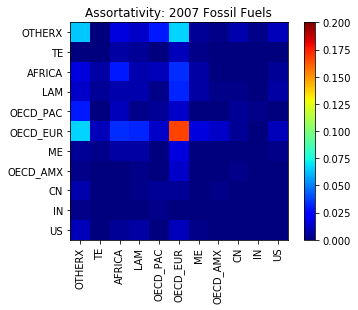

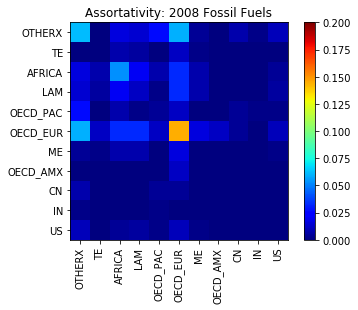

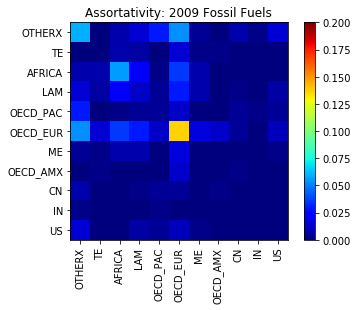

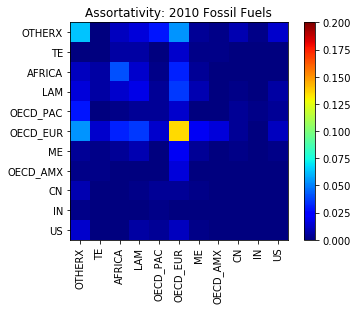

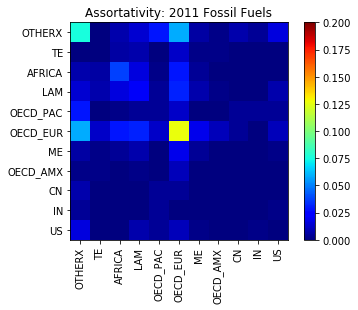

...

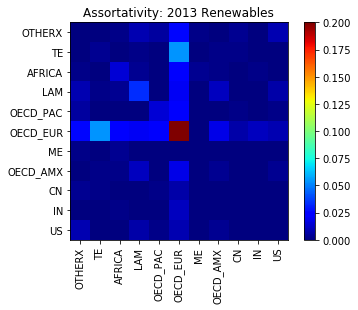

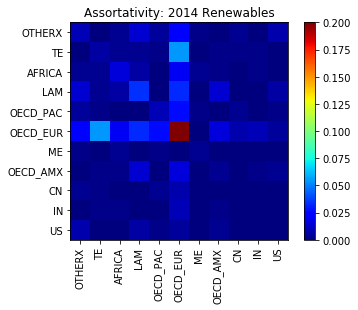

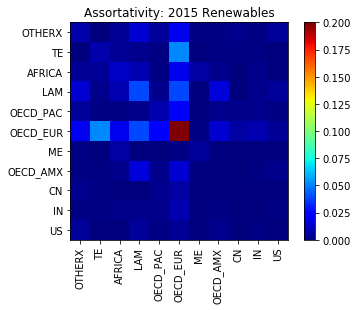

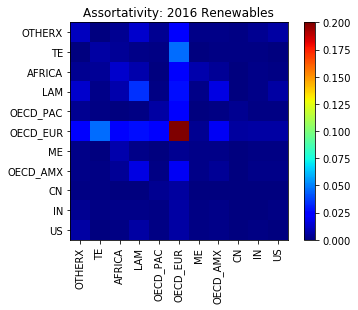

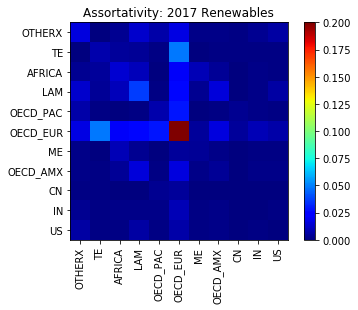

In [9]:
regions =  df_iso2.SIPS_REGION.unique()
mm= dict(zip(regions,range(len(regions))))
print mm
title_dict = dict(zip(['data_ff','data_b','data_g'], ['Fossil Fuels','Low Carbon', 'Renewables']))

for data_str in ['data_ff','data_b','data_g']:
    for y in years:
        G = nx.Graph()
        temp= data[y][data_str].merge(df_iso2[['SIPS_REGION']], left_index=True, right_index=True)
        #print temp.groupby('SIPS_REGION').count().T.merge(df_iso2[['SIPS_REGION']], left_index=True, right_index=True)
        temp= temp[temp>0].groupby('SIPS_REGION').count().T.merge(df_iso2[['SIPS_REGION']], left_index=True, right_index=True)
        #print temp[temp>0].groupby('SIPS_REGION').count()
        #print edges_dict[y][data_str]
        #select only connected nodes
        
        connected_nodes = []
        for e in edges_dict[y][data_str]:
            connected_nodes.append(e[1])
            connected_nodes.append(e[0])
        #print set(connected_nodes)
        
        selected_nodes = [n for n in nodes_dict[y][data_str] if n[0] in connected_nodes]
        #print [n for n in selected_nodes if n[0]=='CN']
        
        
        #G.add_nodes_from(selected_nodes)
        G.add_nodes_from(nodes_dict[y][data_str])
        G.add_edges_from(edges_dict[y][data_str])
        
        plt.imshow(nx.attribute_mixing_matrix(G,'region', mapping=mm), cmap=plt.cm.jet, 
                interpolation='nearest', vmax=0.2)
        plt.yticks(range(len(mm)), regions)
        plt.xticks(range(len(mm)), regions, rotation='vertical')
        plt.title('Assortativity: '+str(y)+' '+str(title_dict[data_str]))
        plt.colorbar()
        plt.savefig('./figures/assortativity_'+str(y)+'_'+str(data_str)+'.png', size=(5,5))
        #plt.plot(nx.attribute_mixing_matrix(G,'region'))
        plt.show()

2007 components 148 147
2008 components 148 145
2009 components 145 142
2010 components 143 138
2011 components 140 135
2012 components 137 132
2013 components 135 129
2014 components 124 119
2015 components 121 118
2016 components 120 117
2017 components 120 117
2007 components 207 202


/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/matplotlib/collections.py:836: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


2008 components 208 202
2009 components 209 204
2010 components 206 201
2011 components 207 201
2012 components 204 197
2013 components 202 196
2014 components 198 192
2015 components 196 190
2016 components 193 186


/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


2017 components 193 186
2007 components 177 173
2008 components 178 174
2009 components 171 167
2010 components 168 164
2011 components 167 162
2012 components 161 157
2013 components 150 146
2014 components 141 135
2015 components 135 130
2016 components 135 128
2017 components 132 126
{'data_ff': {2016: {'n_isolates': 117, 'n_major': 105, 'd_avg_major': DegreeView({u'BE': 1, u'BF': 2, u'BG': 7, u'BA': 1, u'JP': 13, u'BW': 11, u'BR': 12, u'RU': 13, u'RS': 1, u'RE': 2, u'RO': 2, u'GU': 5, u'GT': 7, u'GR': 1, u'GP': 6, u'GB': 29, u'GA': 5, u'GN': 5, u'GL': 4, u'GH': 5, u'OM': 1, u'HR': 1, u'HT': 11, u'HU': 1, u'HN': 4, u'PT': 2, u'PA': 5, u'PG': 3, u'PE': 11, u'PK': 5, u'PH': 12, u'PL': 2, u'ZM': 1, u'EG': 11, u'ZA': 7, u'VN': 2, u'ET': 6, u'ES': 11, u'MG': 1, u'MF': 1, u'UY': 14, u'MM': 13, u'ML': 7, u'MH': 1, u'US': 36, u'MQ': 12, u'MP': 1, u'MY': 4, u'MX': 7, u'IL': 1, u'FR': 18, u'MA': 1, u'FI': 4, u'FJ': 2, u'NL': 18, u'NO': 6, u'NE': 2, u'NG': 10, u'NZ': 1, u'CH': 8, u'CO': 3, u'C

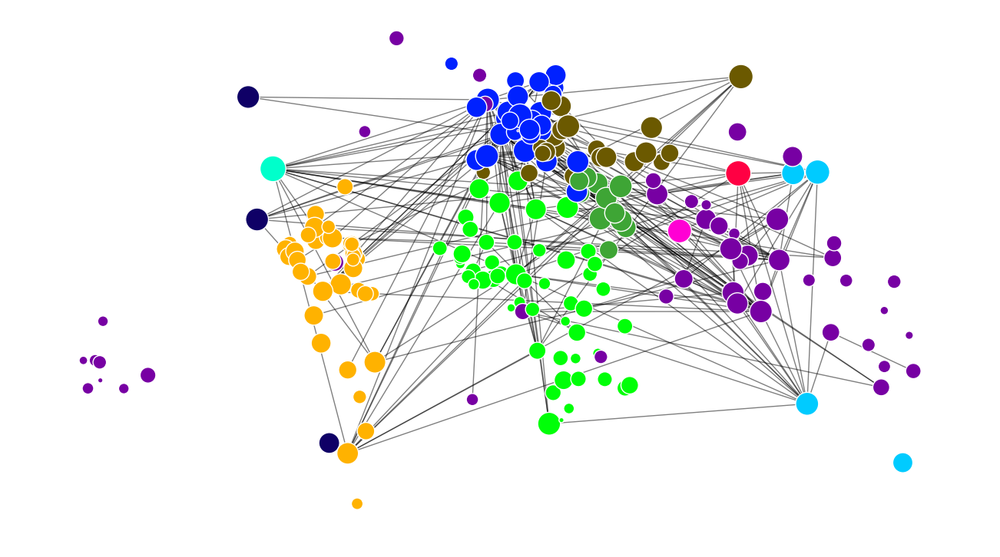

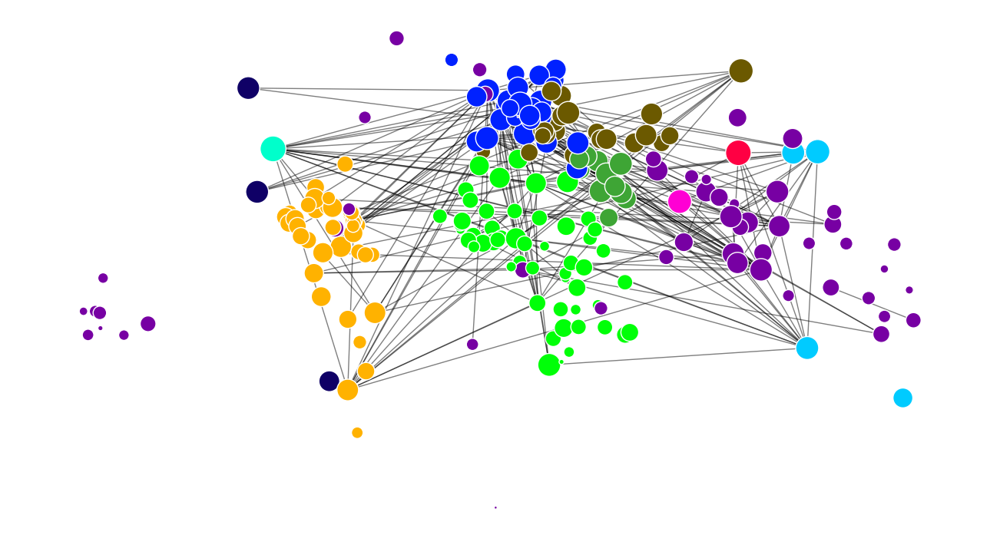

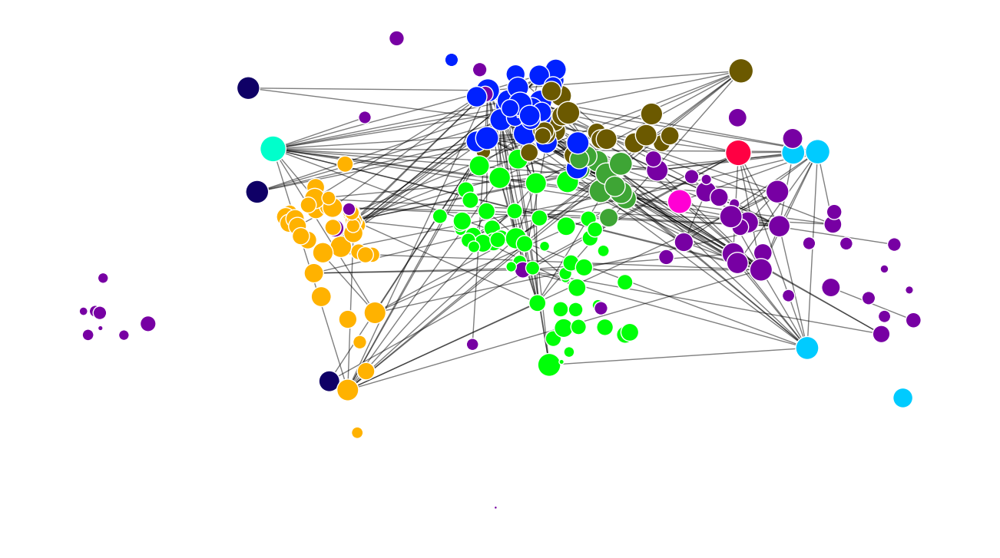

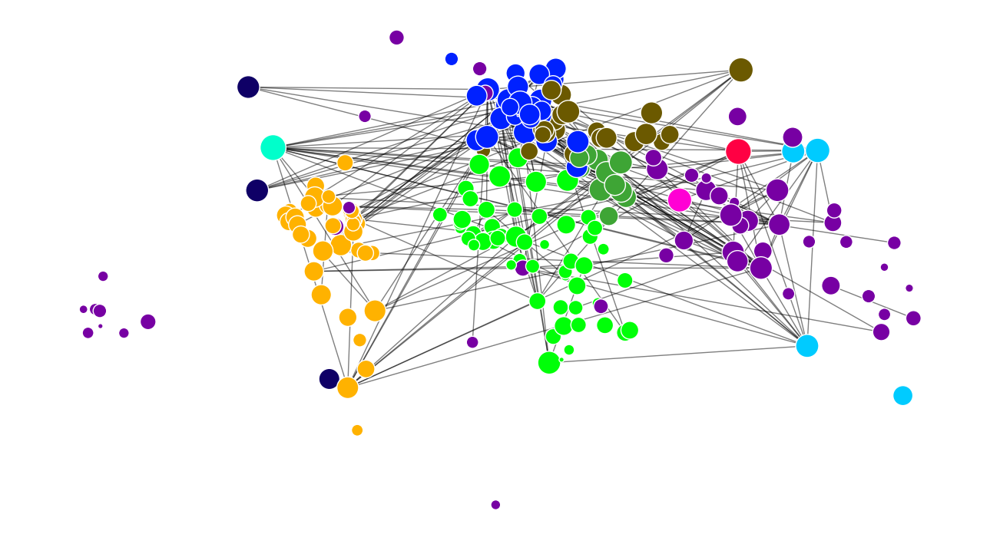

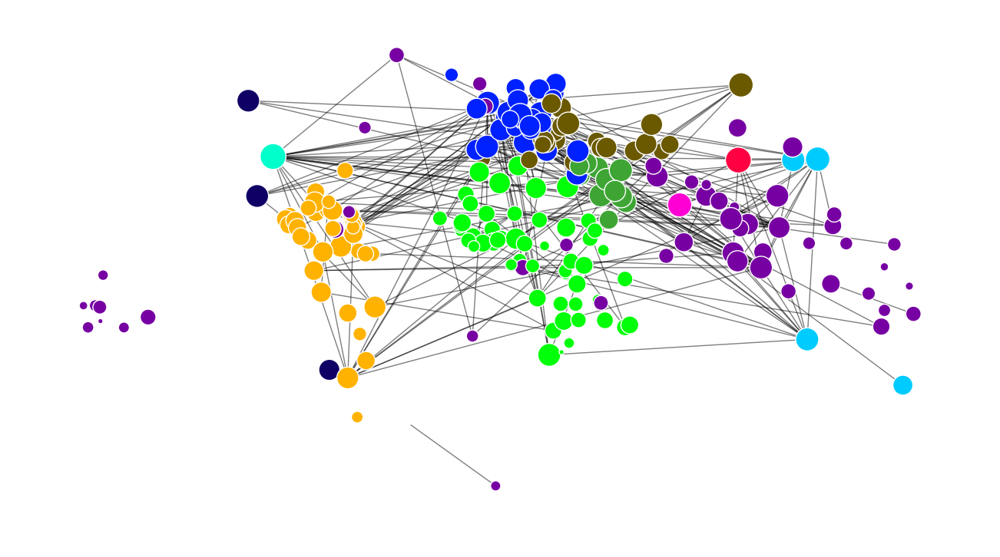

...

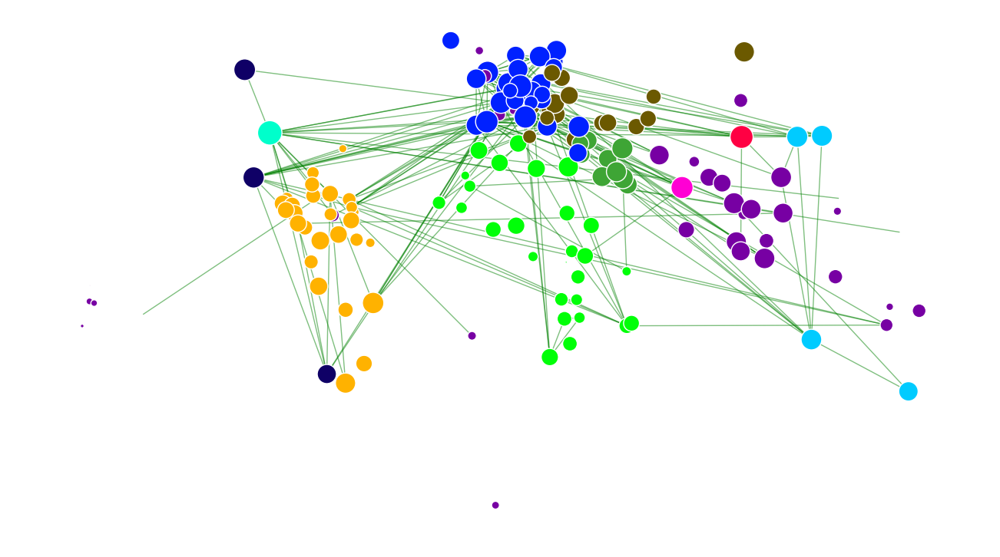

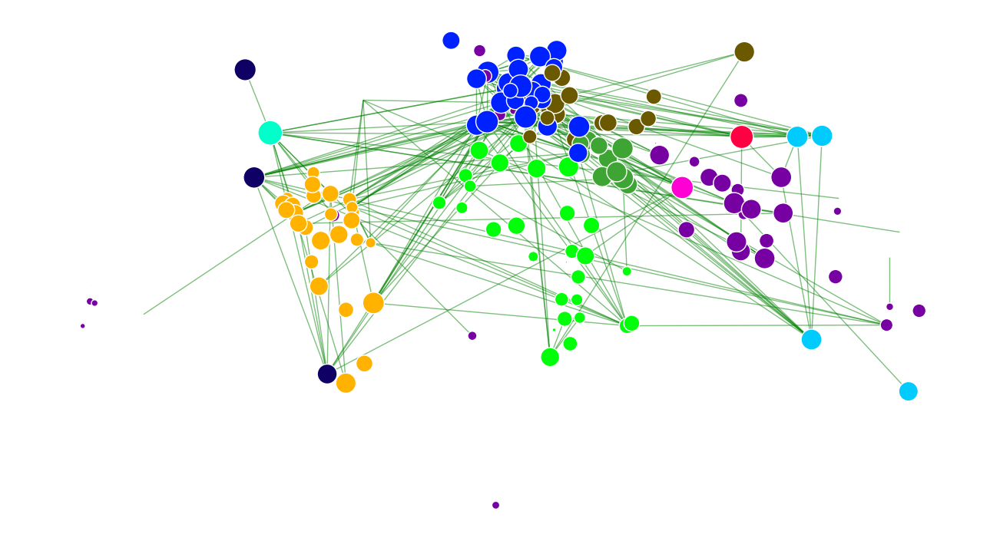

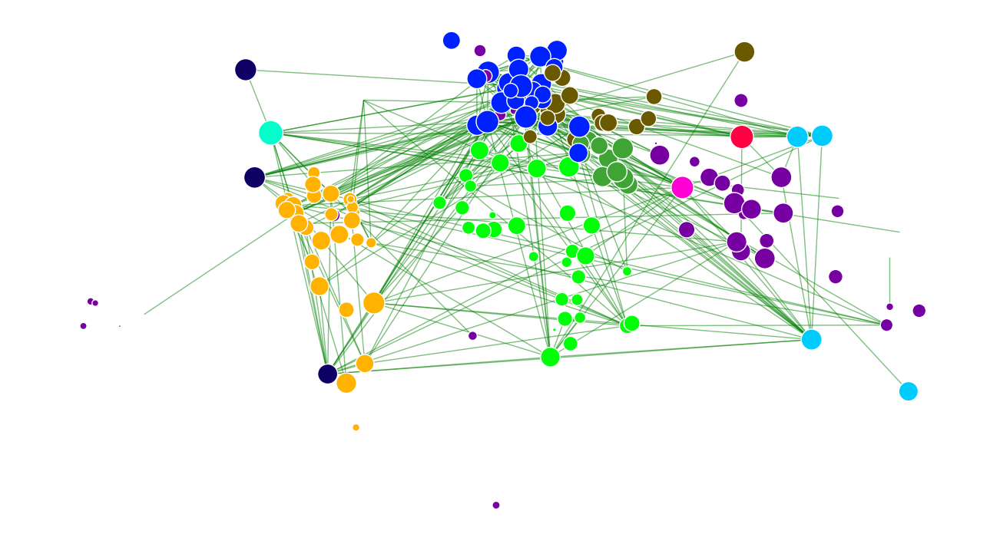

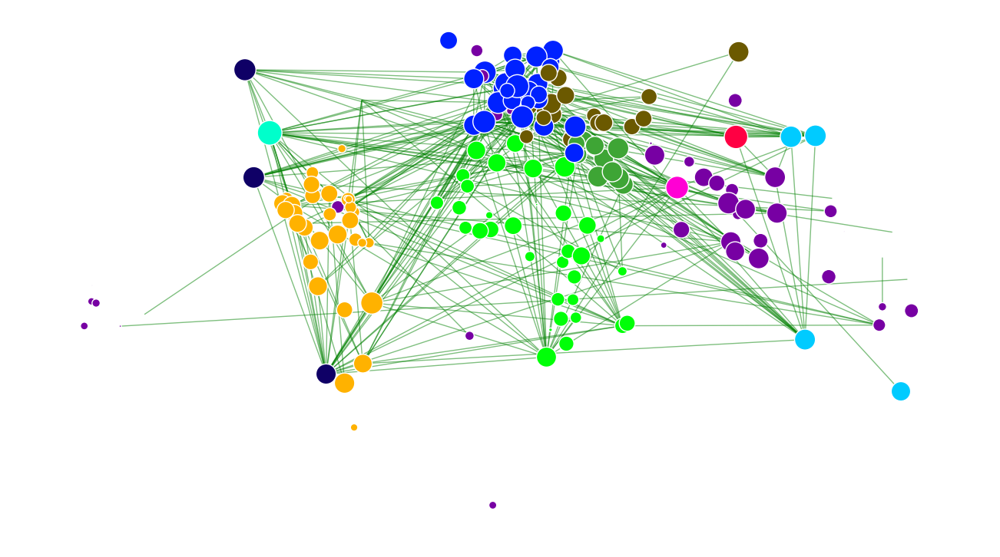

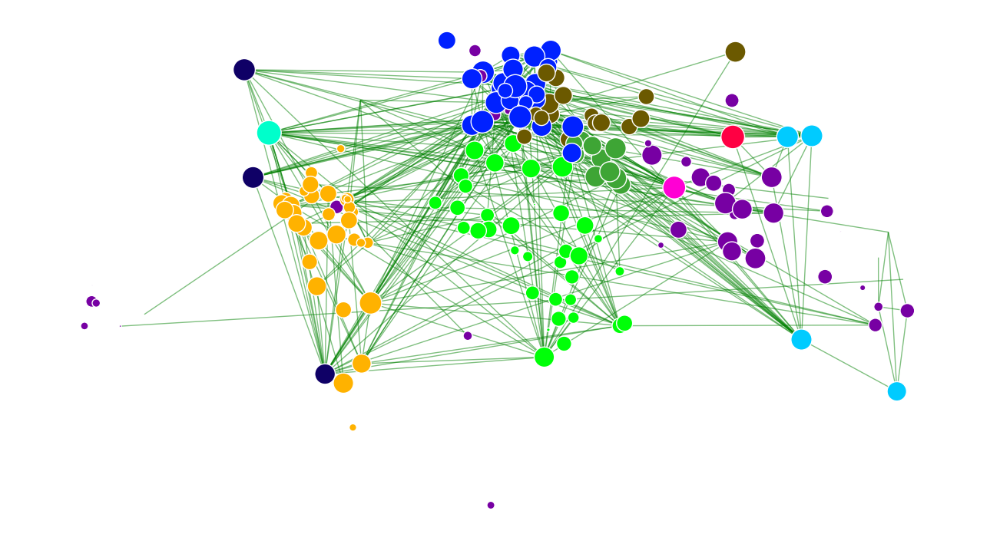

In [10]:
""" show the country graph """
export_data = {}

for data_str in ['data_ff','data_b','data_g']:
    export_data[data_str] ={}
    for y in years:
        export_data[data_str][y] ={}
        
        

        G = nx.Graph()
        #print nodes_dict[y][data_str]
        #print edges_dict[y][data_str]
        #select only connected nodes
        
        connected_nodes = []
        for e in edges_dict[y][data_str]:
            connected_nodes.append(e[1])
            connected_nodes.append(e[0])
        #print set(connected_nodes)
        
        selected_nodes = [n for n in nodes_dict[y][data_str] if n[0] in connected_nodes]
        isolated_nodes = [n for n in nodes_dict[y][data_str] if n[0] not in connected_nodes]
        #print [n for n in selected_nodes if n[0]=='CN']
        #print len(isolated_nodes)

        
        
        #G.add_nodes_from(selected_nodes)
        G.add_nodes_from(nodes_dict[y][data_str])
        G.add_edges_from(edges_dict[y][data_str])
        
        
        #print list(nx.connected_component_subgraphs(G))
        
        Gc = max(nx.connected_component_subgraphs(G), key=len)
        
        #print G.nodes()

        pos = nx.get_node_attributes(G,'pos')
        #benchmark: 2000, 1000
        #pos = nx.spring_layout(Gc, k=4000, iterations=10000, pos=pos, center=[0,0], weight='weight')#fixed=fixed_nodes, 
        
        xs = [pos[k][0] for k,v in pos.iteritems()]
        ys = [pos[k][1] for k,v in pos.iteritems()]
        
        ### Components
        #Isolates
        
        #Diameter of maj component
        #Homophily
        print y,'components',len(list(nx.connected_component_subgraphs(G))), len(isolated_nodes)
        
        export_data[data_str][y]['n_components'] = len(list(nx.connected_component_subgraphs(G))) - len(isolated_nodes)
        export_data[data_str][y]['n_isolates'] = len(isolated_nodes)
        export_data[data_str][y]['n_major'] = len(Gc.nodes())
        export_data[data_str][y]['D_major'] = nx.diameter(Gc)
        export_data[data_str][y]['d_avg_major'] = nx.degree(Gc)
        
        
        #Degree dist - separate
        # 


        #n_sizes = nx.get_node_attributes(G,'n_size')
        #n_colors = nx.get_node_attributes(G,'n_color')
        #n_alphas = nx.get_node_attributes(G,'n_alpha')
        #n_type = nx.get_node_attributes(G,'type')

        #e_colors = nx.get_edge_attributes(G,'e_color')
        #print e_colors

        #e_colors = [G[u][v]['e_color'] for u,v in G.edges()]

        #e_colors_d = dict([((u,v),G[u][v]['e_color']) for u,v in G.edges()])
        #print e_colors_d
        #ecit()
        #e_type = [((u,v),G[u][v]['type']) for u,v in G.edges()]

        #e_anchors = [l[0] for l in e_type if l[1]=='country']
        #e_anchors_colors = [e_colors_d[l] for l in e_anchors]
        #e_companies = [l[0] for l in e_type if l[1]=='company']
        #e_companies_colors = [e_colors_d[l] for l in e_companies]
    
        fig, ax = plt.subplots(figsize=(16,9 ), dpi=100)
        
        # print nx.get_node_attributes(G,'n_color')

        #x_min = min(xs)-10
        #x_max = max(xs)+10
        #y_min = min(ys)-10
        #y_max = max(ys)+10

        #y_lim = [y_min,y_max]
        #x_lim = [x_min,x_max]
        #ax.set_ylim(y_lim)
        #ax.set_xlim(x_lim)
    
        #ax.set_position([0,0,1,1])
        #print min([v for k,v in nx.get_edge_attributes(G,'weight').items()])
        
        
        ### Draw Edges
        nx.draw_networkx_edges(G,
                               pos,
                               edgelist =G.edges(),
                               ax=ax,
                               edge_color=[v for k,v in nx.get_edge_attributes(G,'e_color').items()],
                               alpha=0.5
                              )
        
        #nx.draw_networkx_edges(G, pos, edgelist =e_companies,  alpha=0.2, ax=ax, edge_color=e_companies_colors)#, nodelist=[ncenter], alpha=0.4)
        #print len([v for k,v in nx.get_node_attributes(G,'n_color').items()])
        #print G.nodes()
        #print [nx.get_node_attributes(G,'n_color')[n] for n in G.nodes()]
        #print [(k,v) for k,v in nx.get_node_attributes(G,'n_color').items()]
        
        #for n in G.nodes():
        #    v = n[0]
        #    print v, 'meow'
        #    nx.draw_networkx_nodes(G,pos,ax,nodelist=v, node_color=n[1]['n_color'], node_size=n[1]['n_size'], alpha=n[1]['n_alpha'])
        
        ### Draw Nodes
        nodes_ax = nx.draw_networkx_nodes(G,
                                          pos,
                                          ax=ax,
                                          nodelist=G.nodes(),
                                          node_size = [nx.get_node_attributes(G,'n_size')[n]*100 for n in G.nodes()],
                                          node_color = [nx.get_node_attributes(G,'n_color')[n] for n in G.nodes()],
                                          alpha= [nx.get_node_attributes(G,'n_alpha')[n] for n in G.nodes()]
                                          )
        
        
        #nx.get_node_attributes(G,'n_alpha'))#, nodelist=list(p.keys()),
                           
        #nodes_ax = nx.draw_networkx_nodes(G, pos,ax=ax, nodelist=company_nodes, node_size = n_com_sizes, node_color = n_com_colors,alpha= n_com_alphas)#, nodelist=list(p.keys()),
                           

        nodes_ax.set_edgecolor('w')

        #print 'Generating graphic: '+str(y)
        plt.axis('off')
        fig.savefig('./figures/country_full_'+str(y)+'_'+str(data_str)+'.png')
        #plt.show()
#plt.savefig('output.png')  

print export_data

[1, 3, 3, 5, 5, 5, 6, 5, 3, 3, 3]
[{u'BD': 2, u'BE': 6, u'FR': 30, u'BG': 3, u'DK': 2, u'DO': 4, u'BO': 1, u'JP': 13, u'HU': 2, u'CH': 7, u'DZ': 7, u'BR': 6, u'FI': 2, u'FJ': 1, u'GR': 4, u'ES': 16, u'RU': 7, u'NL': 18, u'PT': 3, u'NO': 4, u'CO': 8, u'TW': 5, u'NC': 3, u'TR': 2, u'LK': 6, u'NG': 13, u'TN': 2, u'LU': 7, u'PG': 2, u'TH': 9, u'PK': 5, u'PH': 17, u'RO': 1, u'EG': 2, u'PL': 3, u'LY': 10, u'GU': 3, u'DE': 9, u'AE': 8, u'CN': 10, u'GP': 1, u'CA': 2, u'IR': 7, u'ZA': 4, u'EC': 1, u'IT': 10, u'CZ': 2, u'AR': 11, u'AU': 15, u'GB': 30, u'GA': 7, u'IN': 2, u'VN': 1, u'GN': 2, u'ID': 24, u'CU': 3, u'PA': 3, u'KE': 1, u'AO': 7, u'ML': 5, u'MY': 5, u'US': 16, u'KR': 3, u'SI': 2, u'SH': 1, u'NI': 2, u'SA': 3, u'TZ': 2, u'SG': 11, u'MX': 7, u'SE': 8, u'AT': 5}, {u'BD': 2, u'BE': 6, u'BF': 2, u'BG': 4, u'DK': 2, u'DO': 4, u'BO': 1, u'JP': 12, u'FR': 27, u'HU': 2, u'CH': 7, u'DZ': 9, u'BR': 6, u'FI': 2, u'GR': 4, u'RU': 9, u'NL': 19, u'PT': 2, u'NO': 4, u'CO': 8, u'TW': 5, u'NC': 3, u'TR

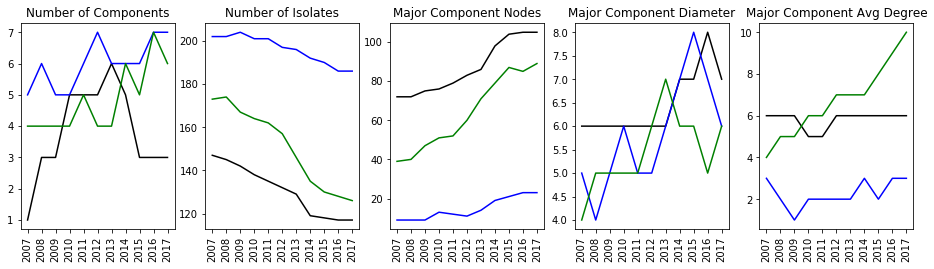

In [14]:
f, axarr = plt.subplots(nrows=1,ncols=5,sharex=True, figsize=(16,3.8))

#for r in axarr:
    #for c in r:
        #c.set_yscale('log')
        #c.set_xscale('log')
        #c.set_ylim(0,60)
        
data_str_dict = {0:'data_ff',1:'data_b',2:'data_g'}        
cols_dict = {0:'black',1:'blue',2:'green'}  
        
        
for ii in range(3):
    components = [export_data[data_str_dict[ii]][y]['n_components'] for y in years]
    print components
    D_major = [export_data[data_str_dict[ii]][y]['D_major'] for y in years]
    n_isolates = [export_data[data_str_dict[ii]][y]['n_isolates'] for y in years]
    n_major = [export_data[data_str_dict[ii]][y]['n_major'] for y in years]
    #n_isolates = [export_data[data_str_dict[ii]][y]['n_isolates'] for y in years]
    dd = [dict(export_data[data_str_dict[ii]][y]['d_avg_major']) for y in years]
    dd = [sum(d.values())/len(d) for d in dd]
    print [dict(export_data[data_str_dict[ii]][y]['d_avg_major']) for y in years]
    print n_isolates
    axarr[0].plot(components, color=cols_dict[ii])
    axarr[1].plot(n_isolates, color=cols_dict[ii])
    axarr[2].plot(n_major, color=cols_dict[ii])
    axarr[3].plot(D_major, color=cols_dict[ii])
    axarr[4].plot(dd, color=cols_dict[ii])
    
axarr[0].set_title('Number of Components')
axarr[1].set_title('Number of Isolates')
axarr[2].set_title('Major Component Nodes')
axarr[3].set_title('Major Component Diameter')
axarr[4].set_title('Major Component Avg Degree')

axarr[0].set_xticks(range(11))
axarr[0].set_xticklabels([str(y) for y in years])
#print dir(axarr[0][0])

for j in range(5):
    plt.sca(axarr[j])
    plt.xticks(rotation='vertical')

#axarr[0][1].set_xticklabels(years)
#axarr[0][2].set_xticklabels(years)
#axarr[0][3].set_xticklabels(years)
#axarr[0][4].set_xticklabels(years)
f.savefig('./figures/country_network_stats.png')
    
        